**Problem Statement :**

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

 

The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

 

The company wants to know the following things about the prospective properties:

Which variables are significant in predicting the price of a house, and

How well those variables describe the price of a house.

 

Also, determine the optimal value of lambda for ridge and lasso regression.

In [1]:
#libraries
import pandas as pd ,numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns

#setting this will help to reproduce same results everytime 
np.random.seed(1)

#filterwarnings and autosave
import warnings 
warnings.filterwarnings("ignore")

%autosave 1

Autosaving every 1 seconds


In [2]:
#setting maximum display rows and columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

### Importing data

In [3]:
#reading the csv 
df = pd.read_csv("train.csv",index_col='Id')
df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500


### Dealing with missing values

In [4]:
#getting the info of the data 
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 1 to 1460
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [5]:
#getting the range and quartiles of the data 
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0
BsmtFinSF2,1460.0,46.549315,161.319273,0.0,0.00,0.0,0.00,1474.0


In [6]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [7]:
##checeking the unique values so that we can divide the data into categorical and numerical 
df.nunique().sort_values()

Street              2
Alley               2
Utilities           2
CentralAir          2
HalfBath            3
PavedDrive          3
BsmtHalfBath        3
LandSlope           3
PoolQC              3
GarageFinish        3
ExterQual           4
KitchenQual         4
MasVnrType          4
BsmtExposure        4
Fence               4
MiscFeature         4
BsmtQual            4
Fireplaces          4
BsmtFullBath        4
LandContour         4
LotShape            4
FullBath            4
KitchenAbvGr        4
BsmtCond            4
GarageCars          5
FireplaceQu         5
GarageQual          5
GarageCond          5
Electrical          5
HeatingQC           5
ExterCond           5
MSZoning            5
YrSold              5
LotConfig           5
BldgType            5
RoofStyle           6
Heating             6
SaleCondition       6
Foundation          6
GarageType          6
BsmtFinType2        6
BsmtFinType1        6
Functional          7
PoolArea            8
BedroomAbvGr        8
HouseStyle

In [8]:
#getting the categorical data
cat_cols_to_plot = df.nunique().sort_values()[df.nunique().sort_values() > 1].keys().to_list()
cat_cols_to_plot

['Street',
 'Alley',
 'Utilities',
 'CentralAir',
 'HalfBath',
 'PavedDrive',
 'BsmtHalfBath',
 'LandSlope',
 'PoolQC',
 'GarageFinish',
 'ExterQual',
 'KitchenQual',
 'MasVnrType',
 'BsmtExposure',
 'Fence',
 'MiscFeature',
 'BsmtQual',
 'Fireplaces',
 'BsmtFullBath',
 'LandContour',
 'LotShape',
 'FullBath',
 'KitchenAbvGr',
 'BsmtCond',
 'GarageCars',
 'FireplaceQu',
 'GarageQual',
 'GarageCond',
 'Electrical',
 'HeatingQC',
 'ExterCond',
 'MSZoning',
 'YrSold',
 'LotConfig',
 'BldgType',
 'RoofStyle',
 'Heating',
 'SaleCondition',
 'Foundation',
 'GarageType',
 'BsmtFinType2',
 'BsmtFinType1',
 'Functional',
 'PoolArea',
 'BedroomAbvGr',
 'HouseStyle',
 'Condition2',
 'RoofMatl',
 'SaleType',
 'Condition1',
 'OverallCond',
 'OverallQual',
 'MoSold',
 'TotRmsAbvGrd',
 'MSSubClass',
 'Exterior1st',
 'Exterior2nd',
 '3SsnPorch',
 'MiscVal',
 'LowQualFinSF',
 'Neighborhood',
 'YearRemodAdd',
 'ScreenPorch',
 'GarageYrBlt',
 'LotFrontage',
 'YearBuilt',
 'EnclosedPorch',
 'BsmtFinSF2',


In [9]:
df = df[cat_cols_to_plot]
df.head()

,Street,Alley,Utilities,CentralAir,HalfBath,PavedDrive,BsmtHalfBath,LandSlope,PoolQC,GarageFinish,ExterQual,KitchenQual,MasVnrType,BsmtExposure,Fence,MiscFeature,BsmtQual,Fireplaces,BsmtFullBath,LandContour,LotShape,FullBath,KitchenAbvGr,BsmtCond,GarageCars,FireplaceQu,GarageQual,GarageCond,Electrical,HeatingQC,ExterCond,MSZoning,YrSold,LotConfig,BldgType,RoofStyle,Heating,SaleCondition,Foundation,GarageType,BsmtFinType2,BsmtFinType1,Functional,PoolArea,BedroomAbvGr,HouseStyle,Condition2,RoofMatl,SaleType,Condition1,OverallCond,OverallQual,MoSold,TotRmsAbvGrd,MSSubClass,Exterior1st,Exterior2nd,3SsnPorch,MiscVal,LowQualFinSF,Neighborhood,YearRemodAdd,ScreenPorch,GarageYrBlt,LotFrontage,YearBuilt,EnclosedPorch,BsmtFinSF2,OpenPorchSF,WoodDeckSF,MasVnrArea,2ndFlrSF,GarageArea,BsmtFinSF1,SalePrice,TotalBsmtSF,1stFlrSF,BsmtUnfSF,GrLivArea,LotArea
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Pave,NaN,AllPub,Y,1,Y,0,Gtl,NaN,RFn,Gd,Gd,BrkFace,No,NaN,NaN,Gd,0,1,Lvl,Reg,2,1,TA,2,NaN,TA,TA,SBrkr,Ex,TA,RL,2008,Inside,1Fam,Gable,GasA,Normal,PConc,Attchd,Unf,GLQ,Typ,0,3,2Story,Norm,CompShg,WD,Norm,5,7,2,8,60,VinylSd,VinylSd,0,0,0,CollgCr,2003,0,2003.0,65.0,2003,0,0,61,0,196.0,854,548,706,208500,856,856,150,1710,8450
2,Pave,NaN,AllPub,Y,0,Y,1,Gtl,NaN,RFn,TA,TA,None,Gd,NaN,NaN,Gd,1,0,Lvl,Reg,2,1,TA,2,TA,TA,TA,SBrkr,Ex,TA,RL,2007,FR2,1Fam,Gable,GasA,Normal,CBlock,Attchd,Unf,ALQ,Typ,0,3,1Story,Norm,CompShg,WD,Feedr,8,6,5,6,20,MetalSd,MetalSd,0,0,0,Veenker,1976,0,1976.0,80.0,1976,0,0,0,298,0.0,0,460,978,181500,1262,1262,284,1262,9600
3,Pave,NaN,AllPub,Y,1,Y,0,Gtl,NaN,RFn,Gd,Gd,BrkFace,Mn,NaN,NaN,Gd,1,1,Lvl,IR1,2,1,TA,2,TA,TA,TA,SBrkr,Ex,TA,RL,2008,Inside,1Fam,Gable,GasA,Normal,PConc,Attchd,Unf,GLQ,Typ,0,3,2Story,Norm,CompShg,WD,Norm,5,7,9,6,60,VinylSd,VinylSd,0,0,0,CollgCr,2002,0,2001.0,68.0,2001,0,0,42,0,162.0,866,608,486,223500,920,920,434,1786,11250
4,Pave,NaN,AllPub,Y,0,Y,0,Gtl,NaN,Unf,TA,Gd,None,No,NaN,NaN,TA,1,1,Lvl,IR1,1,1,Gd,3,Gd,TA,TA,SBrkr,Gd,TA,RL,2006,Corner,1Fam,Gable,GasA,Abnorml,BrkTil,Detchd,Unf,ALQ,Typ,0,3,2Story,Norm,CompShg,WD,Norm,5,7,2,7,70,Wd Sdng,Wd Shng,0,0,0,Crawfor,1970,0,1998.0,60.0,1915,272,0,35,0,0.0,756,642,216,140000,756,961,540,1717,9550
5,Pave,NaN,AllPub,Y,1,Y,0,Gtl,NaN,RFn,Gd,Gd,BrkFace,Av,NaN,NaN,Gd,1,1,Lvl,IR1,2,1,TA,3,TA,TA,TA,SBrkr,Ex,TA,RL,2008,FR2,1Fam,Gable,GasA,Normal,PConc,Attchd,Unf,GLQ,Typ,0,4,2Story,Norm,CompShg,WD,Norm,5,8,12,9,60,VinylSd,VinylSd,0,0,0,NoRidge,2000,0,2000.0,84.0,2000,0,0,84,192,350.0,1053,836,655,250000,1145,1145,490,2198,14260


In [10]:
import plotly.express as px
fig = px.bar(df.isna().mean())
fig.update_traces(marker_color='rgb(158,202,225)',texttemplate='%{text:.2s}', textposition='outside', text=df.isna().sum())
fig.update_layout(title_text='Null value analysis',title_x=0.5,uniformtext_minsize=8, uniformtext_mode='hide',
                 width=1000, height=500)
fig.update_layout({'plot_bgcolor': 'rgba(255,255,255,0)'})
fig.show()

In [11]:
df = df.loc[:, df.isnull().mean() < .50]
print(f"after dropping the features we have {df.shape[0]} datapoints and {df.shape[1]} features")

after dropping the features we have 1460 datapoints and 76 features


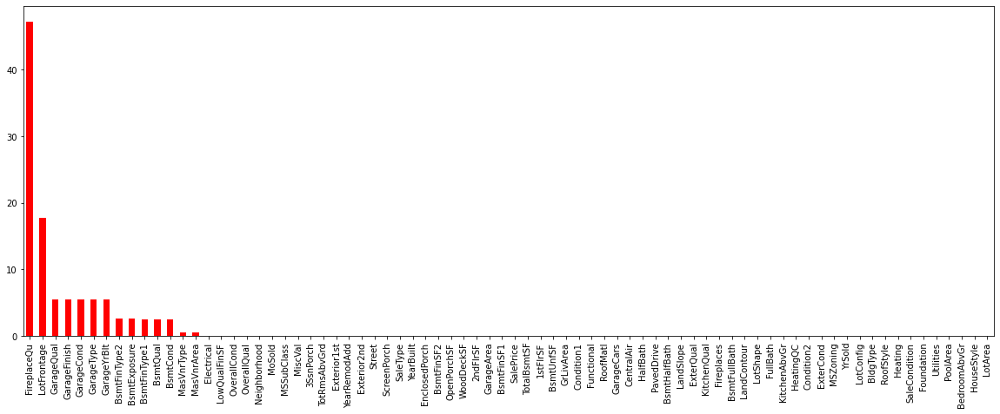

In [12]:
((df.isna().mean().sort_values(ascending=False))*100).plot(kind='bar',figsize=(20,7),color='red')
plt.show()

### EDA

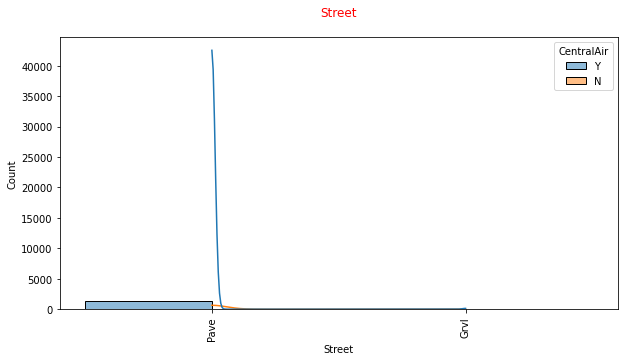

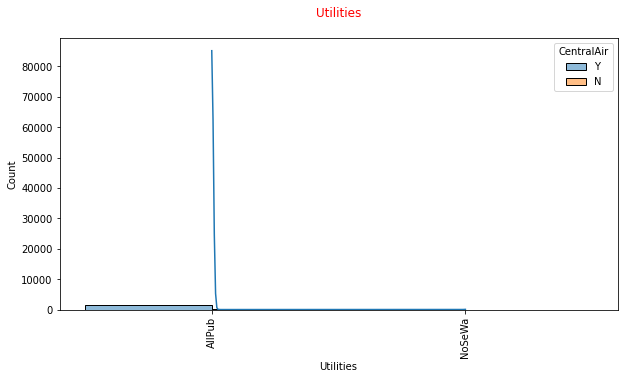

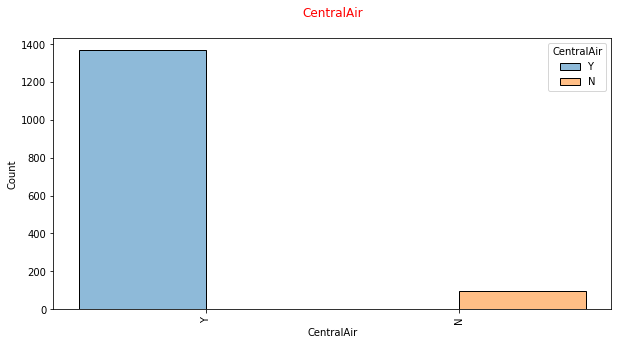

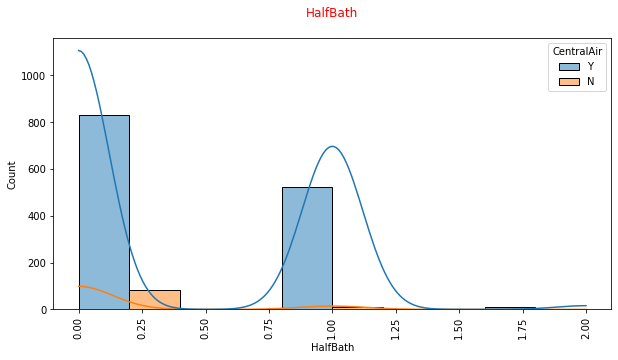

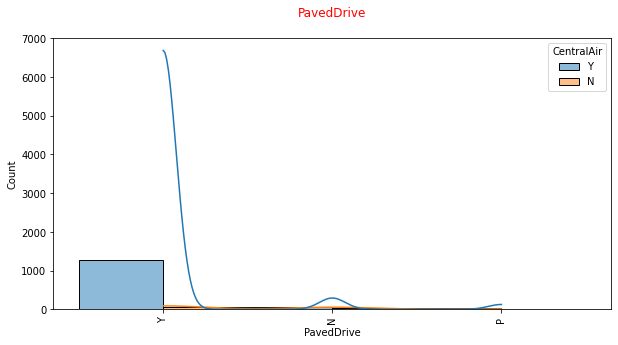

...

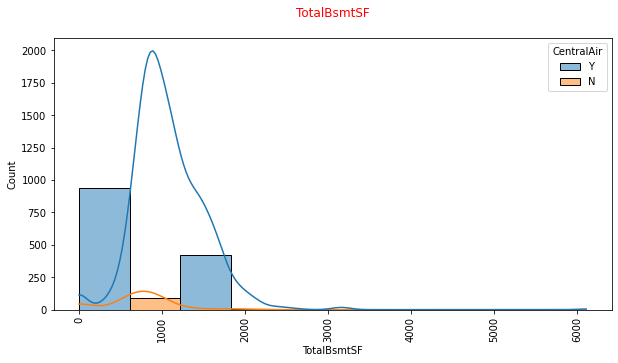

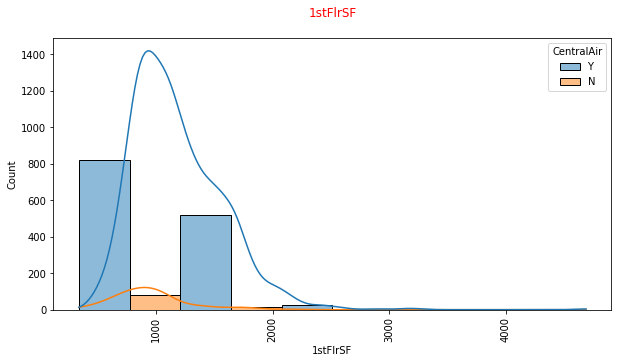

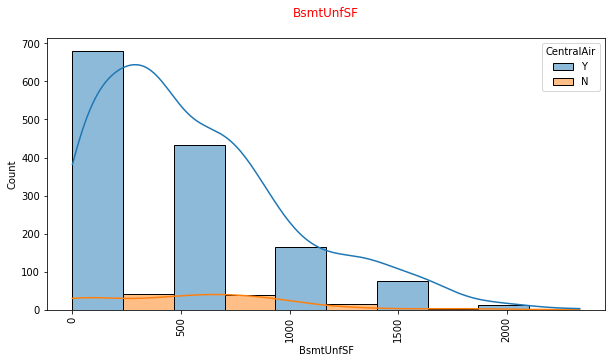

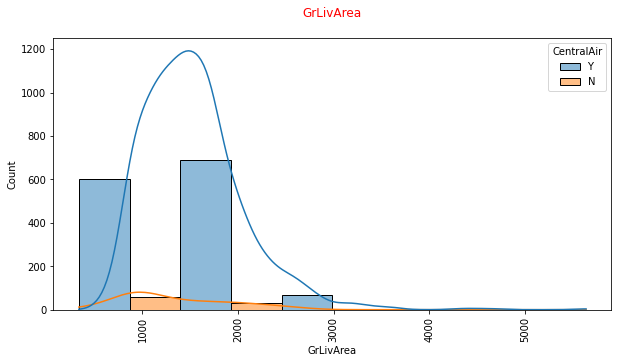

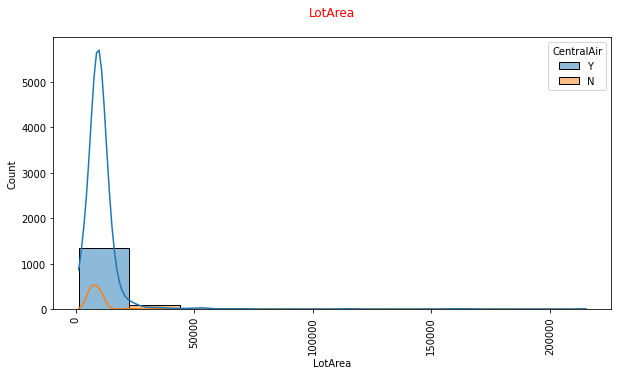

In [13]:
for col in df.columns:
    if col != 'SalePrice':
        plt.figure(figsize=[10,5])
        sns.histplot(data=df, x=col,multiple="dodge",hue="CentralAir",kde=True,bins=5)
        plt.title(f"{col}\n",color='red')
        plt.xticks(rotation=90)
        plt.show()
        print()

- Homes on the street "Pave" are in high demand .
- Garages that have finished unfinished with an area ranging from 300-700 are more in demand.
- Homes having external quality of good to excellent , kitchen quality typical to good are high in demand. Overall, people like homes that are not so expensive or so cheap. They like average kinds of homes, which is true if we refer to the overall market 
- As they are targated to the Australian market, people need the heating conditions to be extremely good with vynyl sliding having a neighbourhood like North ames 
- Single-family homes with gable roofs and foundations such as poured concrete and cinder block are in high demand. 
- People choose single-story homes with an average overall condition of 5 and an overall quality of 7 or above, as compared to 2 story 
- June is the month of high demand.

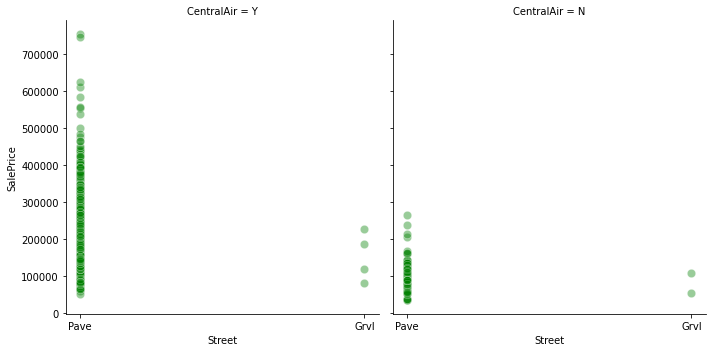

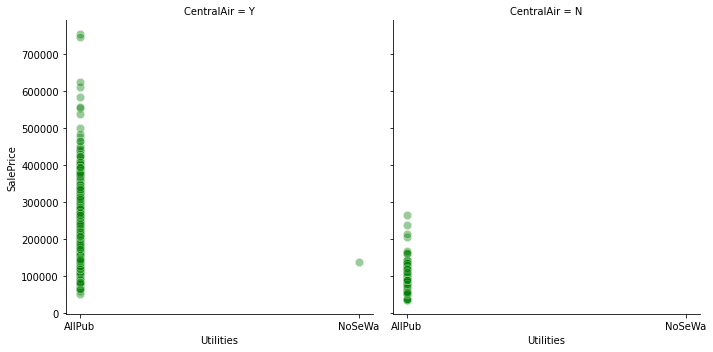

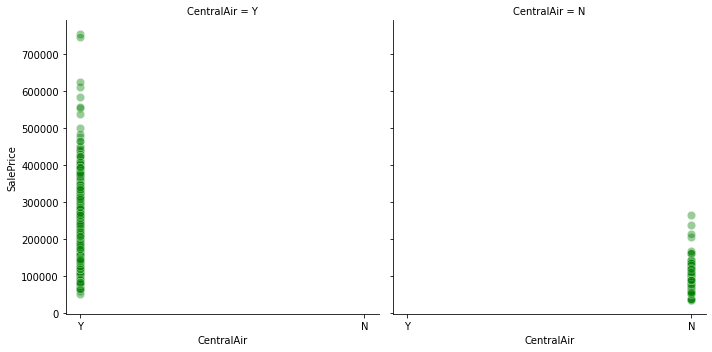

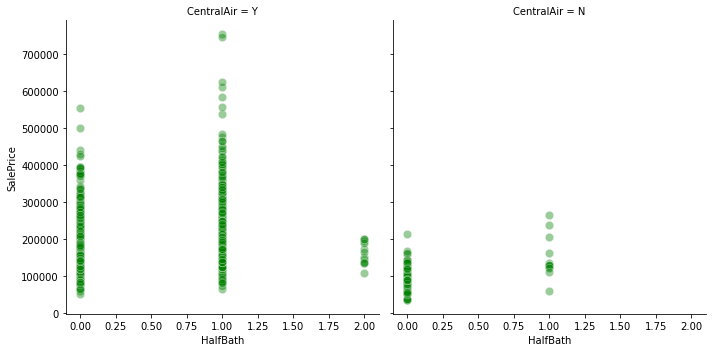

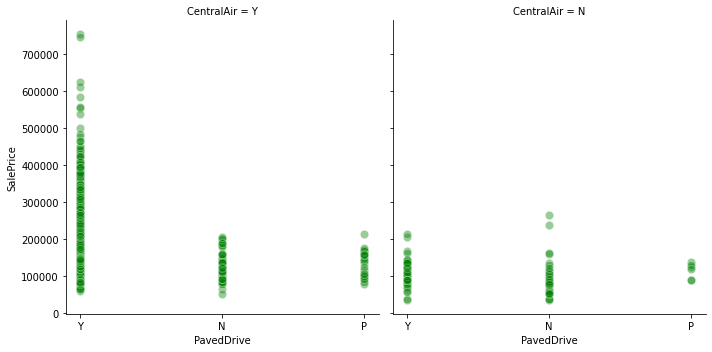

...

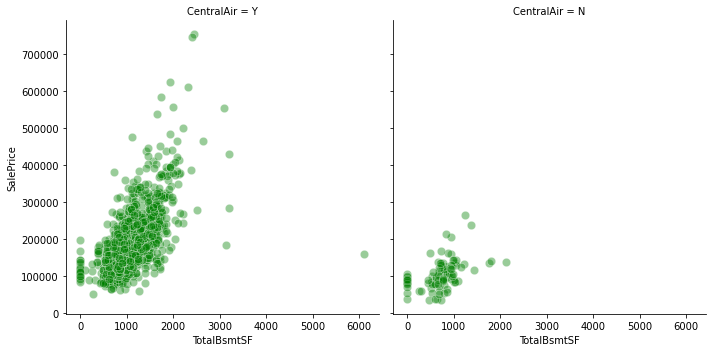

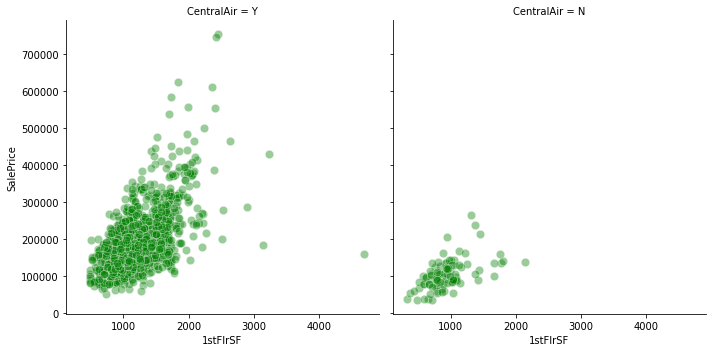

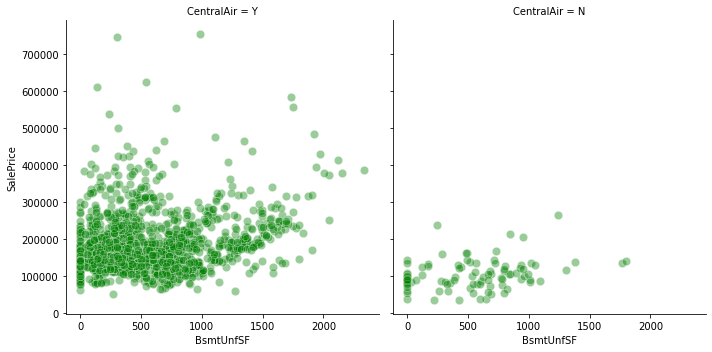

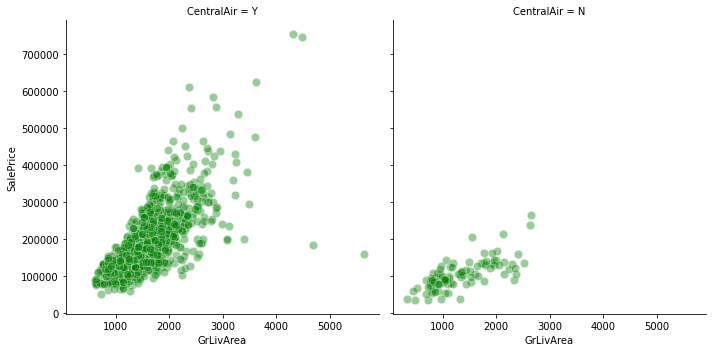

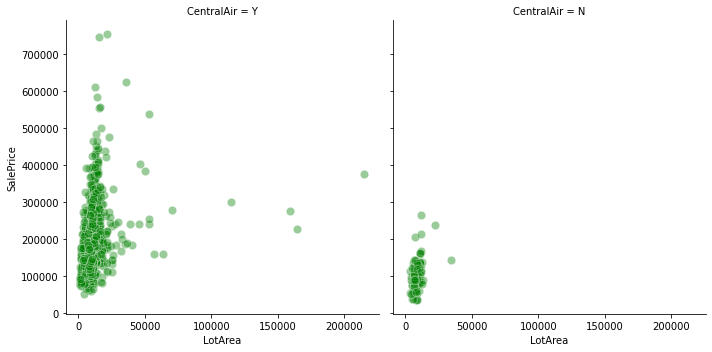

In [14]:
for x in df.columns:
    if x != 'SalePrice':
        sns.relplot(data=df,x=df[x],y=df["SalePrice"],col='CentralAir',color='green',alpha=.4,marker='o',s=70)
        plt.show()

There is no need to go for the outliers treaetemeant as the prices can be high and they can be a little bit more expensive.

In [15]:
#This are the columns that have missing values 
(df.isna().mean().sort_values(ascending=False)>0).sum()

15

In [16]:
#dealing with nan
def nan_checking(col_name):
   
    if col_name.dtype=='object':
        
        col_name.fillna(col_name.mode()[0],inplace=True)
        print('missing values filled with mode')
        return(f"because for {col_name.name} mode is the best method to fill but there is no abs difference as the dtype is object\n")

    else:
        addition_org=[col_name.mean(),col_name.median(),col_name.mode()[0]]
       
        org_sum = sum(addition_org)
       
        addition_mean=[col_name.fillna(col_name.mean()).mean(),col_name.fillna(col_name.mean()).median(),col_name.fillna(col_name.mean()).mode()[0]]

        mean_sum = sum(addition_mean)

        addition_median=[col_name.fillna(col_name.median()).mean(),col_name.fillna(col_name.median()).median(),col_name.fillna(col_name.median()).mode()[0]]

        median_sum = sum(addition_median)
  
        addition_mode=[col_name.fillna(col_name.mode()[0]).mean(),col_name.fillna(col_name.mode()[0]).median(),col_name.fillna(col_name.mode()[0]).mode()[0]]

        mode_sum = sum(addition_mode)

        dic={"mean"  : abs(org_sum-mean_sum),
            "median" : abs(org_sum-median_sum),
            "mode"  : abs(org_sum-mode_sum)}
       
        if min(dic,key=dic.get) == 'mean':
            col_name.fillna(col_name.mean(),inplace=True)
            print('missing values filled with mean')
        elif min(dic,key=dic.get) == 'median':
            col_name.fillna(col_name.median(),inplace=True)
            print('missing values filled with median')
        else :
            col_name.fillna(col_name.mode()[0],inplace=True)
            print('missing values filled with mode')
     
        return(f"because for {col_name.name} {min(dic,key=dic.get)} is the best value to fill and the absolute difference is {dic[min(dic,key=dic.get)]}\n")

In [17]:
list_of_null_columns=[]

for k,v in (df.isna().mean().sort_values(ascending=False)>0)[:(df.isna().mean().sort_values(ascending=False)>0).sum()].items():
    list_of_null_columns.append(k)

for x in list_of_null_columns:
    print(f"{nan_checking(df[x])}")

missing values filled with mode
because for FireplaceQu mode is the best method to fill but there is no abs difference as the dtype is object

missing values filled with mode
because for LotFrontage mode is the best value to fill and the absolute difference is 7.782835080355397

missing values filled with mode
because for GarageQual mode is the best method to fill but there is no abs difference as the dtype is object

missing values filled with mode
because for GarageFinish mode is the best method to fill but there is no abs difference as the dtype is object

missing values filled with mode
because for GarageCond mode is the best method to fill but there is no abs difference as the dtype is object

missing values filled with mode
because for GarageType mode is the best method to fill but there is no abs difference as the dtype is object

missing values filled with mode
because for GarageYrBlt mode is the best value to fill and the absolute difference is 5.969863510385949

missing value

In [18]:
(df.isna().mean().sort_values(ascending=False)>0).sum()

0

In [19]:
df.head()

,Street,Utilities,CentralAir,HalfBath,PavedDrive,BsmtHalfBath,LandSlope,GarageFinish,ExterQual,KitchenQual,MasVnrType,BsmtExposure,BsmtQual,Fireplaces,BsmtFullBath,LandContour,LotShape,FullBath,KitchenAbvGr,BsmtCond,GarageCars,FireplaceQu,GarageQual,GarageCond,Electrical,HeatingQC,ExterCond,MSZoning,YrSold,LotConfig,BldgType,RoofStyle,Heating,SaleCondition,Foundation,GarageType,BsmtFinType2,BsmtFinType1,Functional,PoolArea,BedroomAbvGr,HouseStyle,Condition2,RoofMatl,SaleType,Condition1,OverallCond,OverallQual,MoSold,TotRmsAbvGrd,MSSubClass,Exterior1st,Exterior2nd,3SsnPorch,MiscVal,LowQualFinSF,Neighborhood,YearRemodAdd,ScreenPorch,GarageYrBlt,LotFrontage,YearBuilt,EnclosedPorch,BsmtFinSF2,OpenPorchSF,WoodDeckSF,MasVnrArea,2ndFlrSF,GarageArea,BsmtFinSF1,SalePrice,TotalBsmtSF,1stFlrSF,BsmtUnfSF,GrLivArea,LotArea
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Pave,AllPub,Y,1,Y,0,Gtl,RFn,Gd,Gd,BrkFace,No,Gd,0,1,Lvl,Reg,2,1,TA,2,Gd,TA,TA,SBrkr,Ex,TA,RL,2008,Inside,1Fam,Gable,GasA,Normal,PConc,Attchd,Unf,GLQ,Typ,0,3,2Story,Norm,CompShg,WD,Norm,5,7,2,8,60,VinylSd,VinylSd,0,0,0,CollgCr,2003,0,2003.0,65.0,2003,0,0,61,0,196.0,854,548,706,208500,856,856,150,1710,8450
2,Pave,AllPub,Y,0,Y,1,Gtl,RFn,TA,TA,None,Gd,Gd,1,0,Lvl,Reg,2,1,TA,2,TA,TA,TA,SBrkr,Ex,TA,RL,2007,FR2,1Fam,Gable,GasA,Normal,CBlock,Attchd,Unf,ALQ,Typ,0,3,1Story,Norm,CompShg,WD,Feedr,8,6,5,6,20,MetalSd,MetalSd,0,0,0,Veenker,1976,0,1976.0,80.0,1976,0,0,0,298,0.0,0,460,978,181500,1262,1262,284,1262,9600
3,Pave,AllPub,Y,1,Y,0,Gtl,RFn,Gd,Gd,BrkFace,Mn,Gd,1,1,Lvl,IR1,2,1,TA,2,TA,TA,TA,SBrkr,Ex,TA,RL,2008,Inside,1Fam,Gable,GasA,Normal,PConc,Attchd,Unf,GLQ,Typ,0,3,2Story,Norm,CompShg,WD,Norm,5,7,9,6,60,VinylSd,VinylSd,0,0,0,CollgCr,2002,0,2001.0,68.0,2001,0,0,42,0,162.0,866,608,486,223500,920,920,434,1786,11250
4,Pave,AllPub,Y,0,Y,0,Gtl,Unf,TA,Gd,None,No,TA,1,1,Lvl,IR1,1,1,Gd,3,Gd,TA,TA,SBrkr,Gd,TA,RL,2006,Corner,1Fam,Gable,GasA,Abnorml,BrkTil,Detchd,Unf,ALQ,Typ,0,3,2Story,Norm,CompShg,WD,Norm,5,7,2,7,70,Wd Sdng,Wd Shng,0,0,0,Crawfor,1970,0,1998.0,60.0,1915,272,0,35,0,0.0,756,642,216,140000,756,961,540,1717,9550
5,Pave,AllPub,Y,1,Y,0,Gtl,RFn,Gd,Gd,BrkFace,Av,Gd,1,1,Lvl,IR1,2,1,TA,3,TA,TA,TA,SBrkr,Ex,TA,RL,2008,FR2,1Fam,Gable,GasA,Normal,PConc,Attchd,Unf,GLQ,Typ,0,4,2Story,Norm,CompShg,WD,Norm,5,8,12,9,60,VinylSd,VinylSd,0,0,0,NoRidge,2000,0,2000.0,84.0,2000,0,0,84,192,350.0,1053,836,655,250000,1145,1145,490,2198,14260


Heatmap

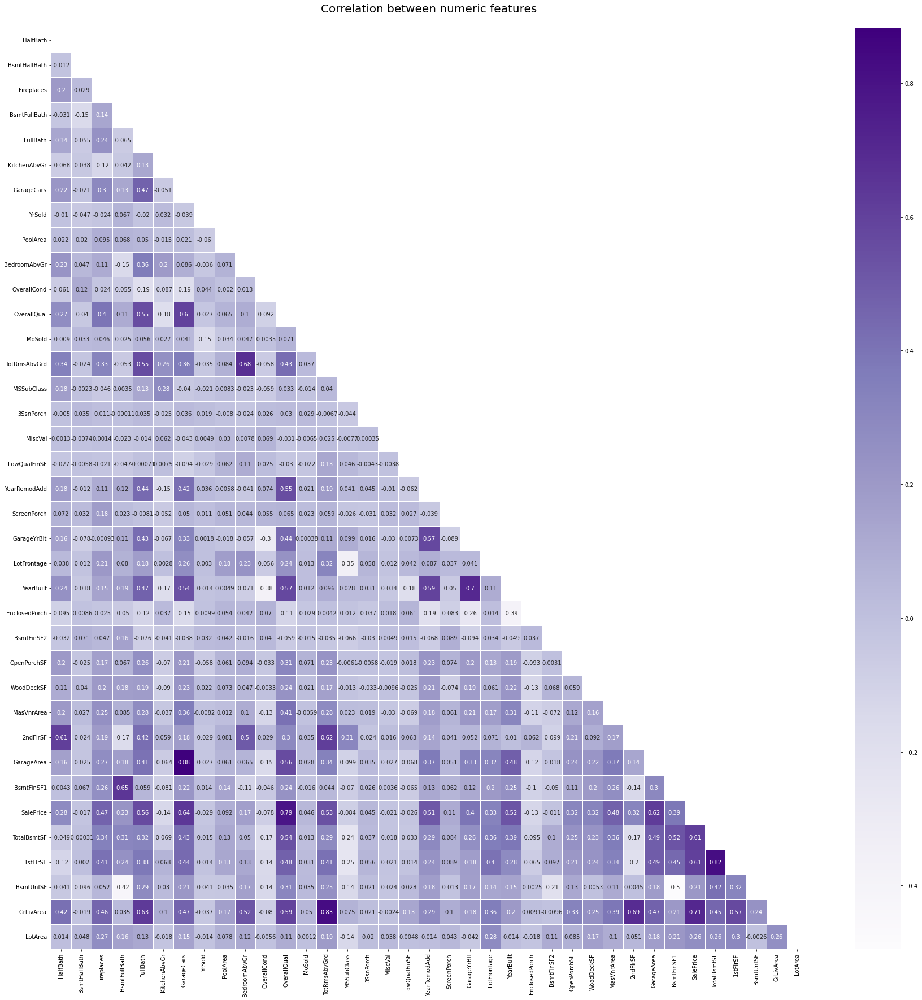

In [20]:
plt.figure(figsize=[30,30])
matrix = np.triu(df.corr())
sns.heatmap(df.corr(),linewidths=.5,cmap="Purples",annot=True,mask=matrix)
plt.title("Correlation between numeric features\n",size=20)
plt.show()

### Creating dummies

In [21]:
#dummies helps us to undestand the data in a better way and do feeature selection 
data_dummies= pd.get_dummies(df,drop_first=True)
data_dummies

,HalfBath,BsmtHalfBath,Fireplaces,BsmtFullBath,FullBath,KitchenAbvGr,GarageCars,YrSold,PoolArea,BedroomAbvGr,OverallCond,OverallQual,MoSold,TotRmsAbvGrd,MSSubClass,3SsnPorch,MiscVal,LowQualFinSF,YearRemodAdd,ScreenPorch,GarageYrBlt,LotFrontage,YearBuilt,EnclosedPorch,BsmtFinSF2,OpenPorchSF,WoodDeckSF,MasVnrArea,2ndFlrSF,GarageArea,BsmtFinSF1,SalePrice,TotalBsmtSF,1stFlrSF,BsmtUnfSF,GrLivArea,LotArea,Street_Pave,Utilities_NoSeWa,CentralAir_Y,PavedDrive_P,PavedDrive_Y,LandSlope_Mod,LandSlope_Sev,GarageFinish_RFn,GarageFinish_Unf,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotShape_IR2,LotShape_IR3,LotShape_Reg,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,1,0,0,1,2,1,2,2008,

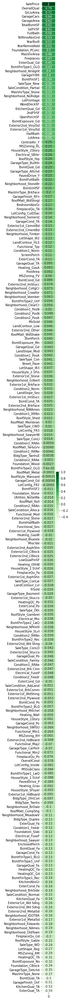

In [22]:
#finding the correlation with respect to the target variable 
plt.figure(figsize=[1,60])
sns.heatmap(pd.DataFrame(data_dummies.corrwith(data_dummies["SalePrice"]).sort_values(ascending=False)),
            linewidths=.5,cmap="Greens",annot=True)
plt.show()

Overallqual,grilivarea,garagecars are the top three variables that are highly positively correlated with saleprice. 
 wheareas The top three highly negatively correlated variables with respect to sale price are  Garagefinish_Unf,KitchenQual_TA,ExterQual_TA 

### Train ,Test and Validation split
Splitting the dataset into train test and val parts with random state 49

In [23]:
from sklearn.model_selection import train_test_split
df_train_test, df_val = train_test_split(data_dummies,train_size = 0.8,test_size = 0.2, random_state = 49)

In [24]:
data_dummies.shape,df_train_test.shape, df_val.shape 

((1460, 237), (1168, 237), (292, 237))

### Scaling
Scaling the data from value 1 and 0 so that we get all of the data into the same range

**The transformation is given by :**

`X_std = (X - X.min(axis=0)) / (X.max(axis=0) - X.min(axis=0))`

`X_scaled = X_std * (max - min) + min`

In [25]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_train_test.head()

,HalfBath,BsmtHalfBath,Fireplaces,BsmtFullBath,FullBath,KitchenAbvGr,GarageCars,YrSold,PoolArea,BedroomAbvGr,OverallCond,OverallQual,MoSold,TotRmsAbvGrd,MSSubClass,3SsnPorch,MiscVal,LowQualFinSF,YearRemodAdd,ScreenPorch,GarageYrBlt,LotFrontage,YearBuilt,EnclosedPorch,BsmtFinSF2,OpenPorchSF,WoodDeckSF,MasVnrArea,2ndFlrSF,GarageArea,BsmtFinSF1,SalePrice,TotalBsmtSF,1stFlrSF,BsmtUnfSF,GrLivArea,LotArea,Street_Pave,Utilities_NoSeWa,CentralAir_Y,PavedDrive_P,PavedDrive_Y,LandSlope_Mod,LandSlope_Sev,GarageFinish_RFn,GarageFinish_Unf,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotShape_IR2,LotShape_IR3,LotShape_Reg,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1188,0,0,1,1,2,1,3,20

We are doing fit and transform both for the train column and only transform for the test column as fit method calculates the max and min values from the whole data and transform does the transformation

- doing fit_transform on val column can cause the data leakage so we are just performing transform on val df


In [26]:
df_train_test = pd.DataFrame(scaler.fit_transform(df_train_test), columns=df_train_test.columns)
df_val = pd.DataFrame(scaler.transform(df_val),columns=df_val.columns)

In [27]:
df_train_test.head()

,HalfBath,BsmtHalfBath,Fireplaces,BsmtFullBath,FullBath,KitchenAbvGr,GarageCars,YrSold,PoolArea,BedroomAbvGr,OverallCond,OverallQual,MoSold,TotRmsAbvGrd,MSSubClass,3SsnPorch,MiscVal,LowQualFinSF,YearRemodAdd,ScreenPorch,GarageYrBlt,LotFrontage,YearBuilt,EnclosedPorch,BsmtFinSF2,OpenPorchSF,WoodDeckSF,MasVnrArea,2ndFlrSF,GarageArea,BsmtFinSF1,SalePrice,TotalBsmtSF,1stFlrSF,BsmtUnfSF,GrLivArea,LotArea,Street_Pave,Utilities_NoSeWa,CentralAir_Y,PavedDrive_P,PavedDrive_Y,LandSlope_Mod,LandSlope_Sev,GarageFinish_RFn,GarageFinish_Unf,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotShape_IR2,LotShape_IR3,LotShape_Reg,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker
0,0.0,0.0,0.333333,0.333333,0.666667,0.0,0.75,0.00,0.0,0.250,0.500,0.777778,0.545455,0.250000,0.000000,0.0,0.0,0.0,0.750000,0.0,0.854545,0.232877,0.884058,0.497409,0.0,0.217973,0.000000,0.000000,0.000000,0.533850,0.257973,0.315373,0.265794,0.296007,0.071918,0.2

In [28]:
df_val.head()

,HalfBath,BsmtHalfBath,Fireplaces,BsmtFullBath,FullBath,KitchenAbvGr,GarageCars,YrSold,PoolArea,BedroomAbvGr,OverallCond,OverallQual,MoSold,TotRmsAbvGrd,MSSubClass,3SsnPorch,MiscVal,LowQualFinSF,YearRemodAdd,ScreenPorch,GarageYrBlt,LotFrontage,YearBuilt,EnclosedPorch,BsmtFinSF2,OpenPorchSF,WoodDeckSF,MasVnrArea,2ndFlrSF,GarageArea,BsmtFinSF1,SalePrice,TotalBsmtSF,1stFlrSF,BsmtUnfSF,GrLivArea,LotArea,Street_Pave,Utilities_NoSeWa,CentralAir_Y,PavedDrive_P,PavedDrive_Y,LandSlope_Mod,LandSlope_Sev,GarageFinish_RFn,GarageFinish_Unf,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotShape_IR2,LotShape_IR3,LotShape_Reg,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker
0,0.0,0.0,0.000000,0.000000,0.333333,0.0,0.25,0.0,0.0,0.375,0.625,0.444444,0.454545,0.500000,0.294118,0.0,0.0,0.0,0.683333,0.0,0.336364,0.099315,0.057971,0.759067,0.0,0.000000,0.000000,0.000000,0.320097,0.169252,0.000000,0.123733,0.104092,0.173245,0.272260,0.26

In [29]:
y_df_train_test = df_train_test.pop('SalePrice')
x_df_train_test = df_train_test

In [30]:
y_df_val = df_val.pop('SalePrice')
x_df_val = df_val

In [31]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

Doing train_test_split

In [32]:
x_train, x_test, y_train, y_test  = train_test_split(x_df_train_test,y_df_train_test,train_size = 0.8,test_size = 0.2, random_state = 13)

**RFE**

Feature ranking with recursive feature elimination.

Given an external estimator that assigns weights to features (e.g., the coefficients of a linear model), the goal of recursive feature elimination (RFE) is to select features by recursively considering smaller and smaller sets of features. First, the estimator is trained on the initial set of features and the importance of each feature is obtained either through any specific attribute or callable. Then, the least important features are pruned from current set of features. That procedure is recursively repeated on the pruned set until the desired number of features to select is eventually reached.

In [33]:
lr = LinearRegression()
lr.fit(x_train, y_train)

rfe = RFE(lr,
          n_features_to_select=30
         )       
rfe = rfe.fit(x_train, y_train)

rfe_df = pd.DataFrame({'Feature': x_train.columns, 'Select Status': rfe.support_, 'Ranking': rfe.ranking_})
rfe_df.sort_values(by='Ranking')

,Feature,Select Status,Ranking
34,GrLivArea,True,1
22,YearBuilt,True,1
168,SaleType_Con,True,1
75,GarageQual_Po,True,1
50,KitchenQual_TA,True,1
...,...,...,...
1,BsmtHalfBath,False,203
72,FireplaceQu_TA,False,204
190,Exterior1st_MetalSd,False,205
66,BsmtCond_Gd,False,206


In [34]:
#rfe support is same as ranking 1
cols = x_train.columns[rfe.support_].to_list()
print(cols,end = "")

['PoolArea', 'OverallCond', 'OverallQual', 'YearBuilt', '2ndFlrSF', 'GarageArea', 'BsmtFinSF1', 'TotalBsmtSF', '1stFlrSF', 'GrLivArea', 'LotArea', 'KitchenQual_Fa', 'KitchenQual_Gd', 'KitchenQual_TA', 'GarageQual_Fa', 'GarageQual_Gd', 'GarageQual_Po', 'GarageQual_TA', 'GarageType_BuiltIn', 'Functional_Sev', 'Condition2_PosN', 'RoofMatl_CompShg', 'RoofMatl_Membran', 'RoofMatl_Roll', 'RoofMatl_Tar&Grv', 'RoofMatl_WdShake', 'RoofMatl_WdShngl', 'SaleType_Con', 'Neighborhood_NoRidge', 'Neighborhood_StoneBr']

In [35]:
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

In [36]:
X_train = x_train[cols]
X_test = x_test[cols]

In [37]:
x_train.shape,y_train.shape,X_train.shape

((934, 236), (934,), (934, 30))

**Lasso :**

The term "Lasso regression" is an acronym for Least Absolute Shrinkage and Selection Operator. It includes a penalty term in the cost function. The absolute sum of the coefficients is represented by this term. This term penalises as the value of the coefficients increases from 0 to 1, causing the model to decrease the value of the coefficients in order to reduce loss. The distinction between ridge and lasso regression is that lasso tends to make coefficients absolute zero, whereas ridge never sets the value of the coefficient to absolute zero.

**GridSearchCV :**

GridSearchCV is the process of tuning hyperparameters to determine the best values for a given model. As previously stated, the value of hyperparameters has a significant impact on model performance. Because there is no way to predict the best values for hyperparameters, we must ideally try all possible values to determine the optimal values. Because doing this manually could take a significant amount of time and resources, we use GridSearchCV to automate hyperparameter tuning.

This function aids in the fitting of your estimator (model) to your training set by looping through predefined hyperparameters. Finally, we can choose the best parameters from the list of hyperparameters.

In [38]:
# Applying lasso with hyperparametertuning

alphas = {'alpha': [0.00001,0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 30,40,50, 60,70,
 80,90,100, 200,300,400,500,600,700,800,900,1000 ]}

lasso = Lasso()

# 50 cross validations
folds = 50
lasso_model = GridSearchCV(estimator = lasso, n_jobs=-1,scoring= 'neg_mean_absolute_error', 
                        param_grid = alphas, 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

lasso_model.fit(X_train, y_train) 

Fitting 50 folds for each of 42 candidates, totalling 2100 fits


GridSearchCV(cv=50, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': [1e-05, 0.0001, 0.001, 0.01, 0.05, 0.1, 0.2,
                                   0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0,
                                   3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20,
                                   30, 40, 50, 60, 70, ...]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [39]:
lasso_model.best_params_

{'alpha': 0.0001}

each domain results with repect to lasso

In [40]:
lasso_result = pd.DataFrame(lasso_model.cv_results_)
lasso_result = lasso_result[lasso_result['param_alpha']<=1]
lasso_result.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,split10_test_score,split11_test_score,split12_test_score,split13_test_score,split14_test_score,split15_test_score,split16_test_score,split17_test_score,split18_test_score,split19_test_score,split20_test_score,split21_test_score,split22_test_score,split23_test_score,split24_test_score,split25_test_score,split26_test_score,split27_test_score,split28_test_score,split29_test_score,split30_test_score,split31_test_score,split32_test_score,split33_test_score,split34_test_score,split35_test_score,split36_test_score,split37_test_score,split38_test_score,split39_test_score,split40_test_score,split41_test_score,split42_test_score,split43_test_score,split44_test_score,split45_test_score,split46_test_score,split47_test_score,split48_test_score,split49_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,split10_train_score,split11_train_score,split12_train_score,split13_train_score,split14_train_score,split15_train_score,split16_train_score,split17_train_score,split18_train_score,split19_train_score,split20_train_score,split21_train_score,split22_train_score,split23_train_score,split24_train_score,split25_train_score,split26_train_score,split27_train_score,split28_train_score,split29_train_score,split30_train_score,split31_train_score,split32_train_score,split33_train_score,split34_train_score,split35_train_score,split36_train_score,split37_train_score,split38_train_score,split39_train_score,split40_train_score,split41_train_score,split42_train_score,split43_train_score,split44_train_score,split45_train_score,split46_train_score,split47_train_score,split48_train_score,split49_train_score,mean_train_score,std_train_score
0,0.017114,0.002893,0.004667,0.000613,0.00001,{'alpha': 1e-05},-0.031294,-0.021297,-0.028712,-0.027127,-0.035650,-0.028137,-0.068915,-0.022397,-0.042736,-0.019315,-0.023535,-0.033401,-0.034290,-0.018510,-0.024888,-0.023934,-0.026351,-0.018689,-0.018322,-0.027357,-0.018363,-0.024709,-0.052586,-0.018131,-0.050546,-0.030891,-0.048332,-0.019218,-0.024400,-0.020642,-0.019060,-0.022969,-0.027492,-0.029439,-0.083488,-0.036508,-0.031194,-0.033847,-0.031773,-0.030578,-0.037203,-0.030944,-0.024546,-0.023606,-0.012415,-0.031452,-0.034916,-0.018400,-0.065727,-0.026420,-0.030693,0.013630,2,-0.025704,-0.025878,-0.025660,-0.025737,-0.025634,-0.025724,-0.025877,-0.025807,-0.025373,-0.025867,-0.025818,-0.025533,-0.025495,-0.025913,-0.025771,-0.025813,-0.025754,-0.025879,-0.025911,-0.025560,-0.025908,-0.025763,-0.025270,-0.025902,-0.025278,-0.025643,-0.025368,-0.025906,-0.025810,-0.025898,-0.025919,-0.025865,-0.025736,-0.025712,-0.025562,-0.025554,-0.025662,-0.025628,-0.025643,-0.025762,-0.025569,-0.025747,-0.025831,-0.025786,-0.026009,-0.025702,-0.025612,-0.025858,-0.025853,-0.025700,-0.025723,0.000168
1,0.010632,0.002069,0.004129,0.000631,0.0001,{'alpha': 0.0001},-0.031970,-0.025012,-0.033061,-0.030407,-0.038117,-0.025037,-0.032234,-0.021472,-0.043197,-0.022309,-0.024873,-0.034290,-0.033931,-0.021692,-0.024500,-0.023171,-0.026834,-0.023767,-0.021240,-0.030372,-0.022133,-0.029645,-0.049057,-0.018948,-0.061492,-0.029306,-0.044075,-0.019622,-0.025076,-0.022593,-0.016014,-0.024843,-0.026790,-0.025865,-0.081566,-0.034526,-0.035251,-0.032794,-0.030058,-0.026656,-0.038674,-0.036727,-0.024194,-0.023222,-0.014766,-0.036038,-0.040348,-0.017476,-0.033219,-0.029129,-0.030352,0.011322,1,-0.028121,-0.028277,-0.028061,-0.028128,-0.028036,-0.028217,-0.027896,-0.028258,-0.027773,-0.028276,-0.028258,-0.027972,-0.027987,-0.028277,-0.028222,-0.028195,-0.028154,-0.028208,-0.028302,-0.028023,-0.028287,-0.028236,-0.02

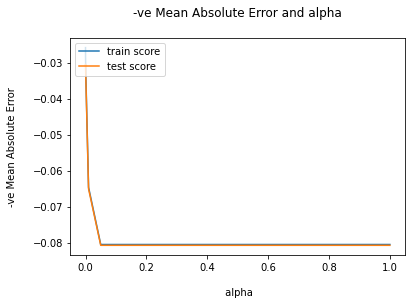

In [41]:
# plotting mean test and train scoes with alpha 
lasso_result['param_alpha'] = lasso_result['param_alpha'].astype('float32')

# plotting
plt.plot(lasso_result['param_alpha'], lasso_result['mean_train_score'])
plt.plot(lasso_result['param_alpha'], lasso_result['mean_test_score'])
plt.xlabel('\n alpha')
plt.ylabel('-ve Mean Absolute Error\n')
plt.title("-ve Mean Absolute Error and alpha\n")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [42]:
alpha = lasso_model.best_params_['alpha']
lasso = Lasso(alpha=alpha)

lasso.fit(X_train, y_train)

#coefficient
lasso.coef_

array([-0.00815538,  0.0448027 ,  0.21083668,  0.07151128,  0.        ,
        0.07802687,  0.09394972,  0.        ,  0.08275648,  0.27757411,
        0.176184  , -0.06174704, -0.06040563, -0.07677248, -0.00274574,
        0.        , -0.        ,  0.        ,  0.00702476, -0.        ,
       -0.17641906,  0.10249544,  0.07454124,  0.        ,  0.08763026,
        0.06893903,  0.14284373,  0.01323744,  0.0686124 ,  0.07521594])

In [43]:
# lasso model parameters
model_param = list(lasso.coef_ )
model_param.insert(0, lasso.intercept_)
model_param = [round(x, 4) for x in model_param]
cols = X_train.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_param))

[('constant', -0.1533),
 ('PoolArea', -0.0082),
 ('OverallCond', 0.0448),
 ('OverallQual', 0.2108),
 ('YearBuilt', 0.0715),
 ('2ndFlrSF', 0.0),
 ('GarageArea', 0.078),
 ('BsmtFinSF1', 0.0939),
 ('TotalBsmtSF', 0.0),
 ('1stFlrSF', 0.0828),
 ('GrLivArea', 0.2776),
 ('LotArea', 0.1762),
 ('KitchenQual_Fa', -0.0617),
 ('KitchenQual_Gd', -0.0604),
 ('KitchenQual_TA', -0.0768),
 ('GarageQual_Fa', -0.0027),
 ('GarageQual_Gd', 0.0),
 ('GarageQual_Po', -0.0),
 ('GarageQual_TA', 0.0),
 ('GarageType_BuiltIn', 0.007),
 ('Functional_Sev', -0.0),
 ('Condition2_PosN', -0.1764),
 ('RoofMatl_CompShg', 0.1025),
 ('RoofMatl_Membran', 0.0745),
 ('RoofMatl_Roll', 0.0),
 ('RoofMatl_Tar&Grv', 0.0876),
 ('RoofMatl_WdShake', 0.0689),
 ('RoofMatl_WdShngl', 0.1428),
 ('SaleType_Con', 0.0132),
 ('Neighborhood_NoRidge', 0.0686),
 ('Neighborhood_StoneBr', 0.0752)]

R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model. Whereas correlation explains the strength of the relationship between an independent and dependent variable, R-squared explains to what extent the variance of one variable explains the variance of the second variable. So, if the R2 of a model is 0.50, then approximately half of the observed variation can be explained by the model's inputs.

In [44]:
from sklearn import metrics

# lasso prediction and model making 
lassom = Lasso(alpha=lasso_model.best_params_['alpha'])
lassom.fit(X_train, y_train)

# prediction on the train,test and val set
y_train_pred = lassom.predict(X_train)
print(f'r2 on train =  {round(metrics.r2_score(y_true=y_train, y_pred=y_train_pred),4)}')
y_test_pred = lassom.predict(X_test)
print(f'r2 on test =  {round(metrics.r2_score(y_true=y_test, y_pred=y_test_pred),4)}')
y_val_pred = lassom.predict(x_df_val[cols[1:]])
print(f'r2 on val =  {round(metrics.r2_score(y_true=y_df_val, y_pred=y_val_pred),4)}')

r2 on train =  0.8279
r2 on test =  0.8155
r2 on val =  0.8476


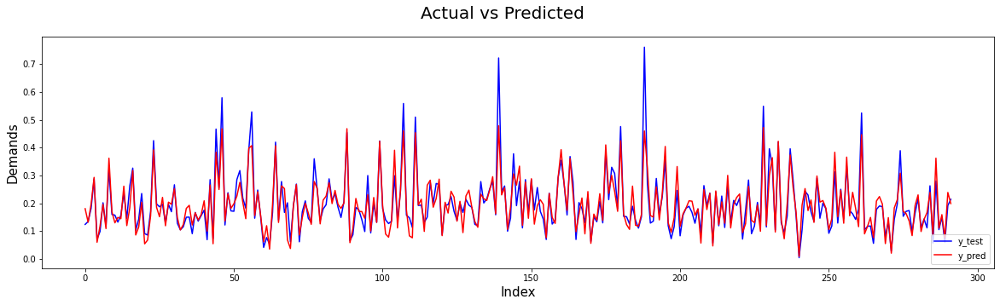

In [45]:
# Actual vs Predicted
plt.figure(figsize=[20,5])
c = [i for i in range(0,len(y_df_val),1)]
plt.plot(c,y_df_val, color="blue")
plt.plot(c,y_val_pred, color="red")
plt.suptitle('Actual vs Predicted\n', fontsize = 20)
plt.legend(["y_test", "y_pred"], loc ="lower right")
plt.xlabel('Index',fontsize=15)
plt.ylabel('Demands',fontsize=15)
plt.show()

In [46]:
print('RMSE error ', np.sqrt(metrics.mean_squared_error(y_df_val, y_val_pred)))

RMSE error  0.04221034321483585


**What Is an Error Term?**

An error term is a residual variable produced by a statistical or mathematical model, which is created when the model does not fully represent the actual relationship between the independent variables and the dependent variables. As a result of this incomplete relationship, the error term is the amount at which the equation may differ during empirical analysis.

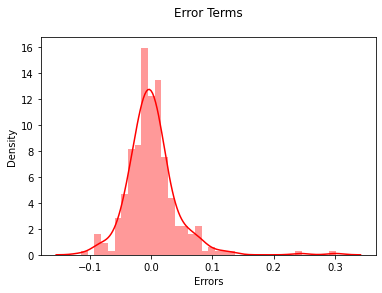

In [47]:
#Plot a histogram of the error terms
def plot_res_dist(act, pred):
    sns.distplot(act-pred,color='red')
    plt.title('Error Terms\n')
    plt.xlabel('Errors')
    
plot_res_dist(y_df_val,y_val_pred)

we can see that the mean lies at 0 so we have good model in hand

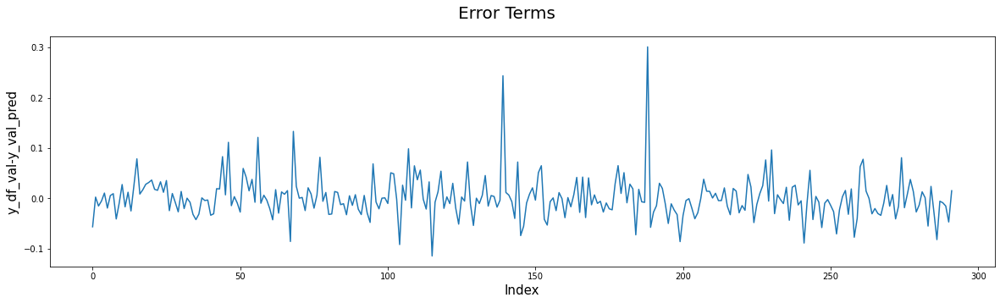

In [48]:
# Error Terms
plt.figure(figsize=[20,5])
c = [i for i in range(0,len(y_df_val),1)]
plt.plot(c,y_df_val-y_val_pred)
plt.suptitle('Error Terms', fontsize = 20)
plt.xlabel('Index', fontsize = 15)
plt.ylabel('y_df_val-y_val_pred', fontsize = 15)
plt.show()

**Residual analysis**

The analysis of residuals plays an important role in validating the regression model. If the error term in the regression model satisfies the four assumptions noted earlier, then the model is considered valid. Since the statistical tests for significance are also based on these assumptions, the conclusions resulting from these significance tests are called into question if the assumptions regarding ε are not satisfied.

The ith residual is the difference between the observed value of the dependent variable, yi, and the value predicted by the estimated regression equation, ŷi. These residuals, computed from the available data, are treated as estimates of the model error, ε. As such, they are used by statisticians to validate the assumptions concerning ε. Good judgment and experience play key roles in residual analysis.

Graphical plots and statistical tests concerning the residuals are examined carefully by statisticians, and judgments are made based on these examinations. The most common residual plot shows ŷ on the horizontal axis and the residuals on the vertical axis. If the assumptions regarding the error term, ε, are satisfied, the residual plot will consist of a horizontal band of points. If the residual analysis does not indicate that the model assumptions are satisfied, it often suggests ways in which the model can be modified to obtain better results.

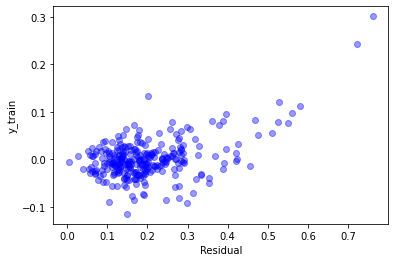

In [49]:
# scatter plot for the check
residual = (y_df_val-y_val_pred)
plt.scatter(y_df_val,residual,color="blue",alpha=.4)
plt.ylabel("y_train")
plt.xlabel("Residual")
plt.show()

In [50]:
#y_test vs y_pred
import scipy.stats
stat, p = scipy.stats.pearsonr(y_df_val, y_val_pred) 
fig = px.scatter(x=y_df_val,y=y_val_pred, trendline="ols", trendline_color_override="red",
                title=f'Relationship Between y_test and y_pred [corr = {round(stat,4)}]',
                template='none')
fig.update_xaxes(showgrid=False,title='y_test')
fig.update_yaxes(showgrid=False,title='y_pred')
fig.show()

In [51]:
mod = list(zip(cols, model_param))
params = pd.DataFrame(mod)
params.columns = ['Variable', 'Coeff']
params

,Variable,Coeff
0,constant,-0.1533
1,PoolArea,-0.0082
2,OverallCond,0.0448
3,OverallQual,0.2108
4,YearBuilt,0.0715
5,2ndFlrSF,0.0000
6,GarageArea,0.0780
7,BsmtFinSF1,0.0939
8,TotalBsmtSF,0.0000
9,1stFlrSF,0.0828


Sorting the coefficient 

In [52]:
params_sort = params.sort_values((['Coeff']), axis = 0, ascending = False)
params_sort

,Variable,Coeff
10,GrLivArea,0.2776
3,OverallQual,0.2108
11,LotArea,0.1762
27,RoofMatl_WdShngl,0.1428
22,RoofMatl_CompShg,0.1025
7,BsmtFinSF1,0.0939
25,RoofMatl_Tar&Grv,0.0876
9,1stFlrSF,0.0828
6,GarageArea,0.0780
30,Neighborhood_StoneBr,0.0752


Let's choose the coefficient which has a non-zero value 

In [53]:
pred_var = pd.DataFrame(params_sort[(params_sort['Coeff'] != 0)])
pred_var

,Variable,Coeff
10,GrLivArea,0.2776
3,OverallQual,0.2108
11,LotArea,0.1762
27,RoofMatl_WdShngl,0.1428
22,RoofMatl_CompShg,0.1025
7,BsmtFinSF1,0.0939
25,RoofMatl_Tar&Grv,0.0876
9,1stFlrSF,0.0828
6,GarageArea,0.0780
30,Neighborhood_StoneBr,0.0752


In [54]:
#So the final dimension becomes
pred_var.shape

(24, 2)

A list of predictive variables

In [55]:
Lassso_var = list(pred_var['Variable'])
Lassso_var

['GrLivArea',
 'OverallQual',
 'LotArea',
 'RoofMatl_WdShngl',
 'RoofMatl_CompShg',
 'BsmtFinSF1',
 'RoofMatl_Tar&Grv',
 '1stFlrSF',
 'GarageArea',
 'Neighborhood_StoneBr',
 'RoofMatl_Membran',
 'YearBuilt',
 'RoofMatl_WdShake',
 'Neighborhood_NoRidge',
 'OverallCond',
 'SaleType_Con',
 'GarageType_BuiltIn',
 'GarageQual_Fa',
 'PoolArea',
 'KitchenQual_Gd',
 'KitchenQual_Fa',
 'KitchenQual_TA',
 'constant',
 'Condition2_PosN']

In [56]:
X_train_lasso = X_train[[x for x in Lassso_var if x != 'constant']]
X_train_lasso.head()

,GrLivArea,OverallQual,LotArea,RoofMatl_WdShngl,RoofMatl_CompShg,BsmtFinSF1,RoofMatl_Tar&Grv,1stFlrSF,GarageArea,Neighborhood_StoneBr,RoofMatl_Membran,YearBuilt,RoofMatl_WdShake,Neighborhood_NoRidge,OverallCond,SaleType_Con,GarageType_BuiltIn,GarageQual_Fa,PoolArea,KitchenQual_Gd,KitchenQual_Fa,KitchenQual_TA,Condition2_PosN
418,0.249246,0.555556,0.050737,0.0,1.0,0.219171,0.0,0.303580,0.341326,0.0,0.0,0.710145,0.0,0.0,0.25,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
87,0.133007,0.444444,0.033326,0.0,1.0,0.109142,0.0,0.162001,0.000000,0.0,0.0,0.768116,0.0,0.0,0.50,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
865,0.389789,0.666667,0.106523,0.0,1.0,0.000000,0.0,0.200321,0.246121,0.0,0.0,0.492754,0.0,0.0,0.75,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
129,0.144310,0.333333,0.052317,0.0,1.0,0.074238,0.0,0.175769,0.220028,0.0,0.0,0.637681,0.0,0.0,0.50,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
670,0.081763,0.444444,0.033396,0.0,1.0,0.116230,0.0,0.099587,0.279267,0.0,0.0,0.724638,0.0,0.0,0.75,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [57]:
X_train_lasso.shape

(934, 23)

In [58]:
X_test_lasso = X_test[[x for x in Lassso_var if x != 'constant']]
X_test_lasso.head()

,GrLivArea,OverallQual,LotArea,RoofMatl_WdShngl,RoofMatl_CompShg,BsmtFinSF1,RoofMatl_Tar&Grv,1stFlrSF,GarageArea,Neighborhood_StoneBr,RoofMatl_Membran,YearBuilt,RoofMatl_WdShake,Neighborhood_NoRidge,OverallCond,SaleType_Con,GarageType_BuiltIn,GarageQual_Fa,PoolArea,KitchenQual_Gd,KitchenQual_Fa,KitchenQual_TA,Condition2_PosN
84,0.224378,0.555556,0.003819,0.0,1.0,0.077250,0.0,0.099816,0.310296,0.0,0.0,0.927536,0.0,0.0,0.500,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1120,0.250000,0.555556,0.038795,0.0,1.0,0.147236,0.0,0.304497,0.265867,0.0,0.0,0.601449,0.0,0.0,0.625,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
720,0.180294,0.555556,0.007418,0.0,1.0,0.177711,0.0,0.219596,0.303949,0.0,0.0,0.898551,0.0,0.0,0.500,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
107,0.106443,0.444444,0.030382,0.0,1.0,0.079731,0.0,0.129647,0.203103,0.0,0.0,0.688406,0.0,0.0,0.750,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
699,0.340618,0.555556,0.054687,0.0,1.0,0.079376,0.0,0.194585,0.358956,0.0,0.0,0.695652,0.0,0.0,0.625,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [59]:
X_test_lasso.shape

(234, 23)

**Ridge Regression :**

Ridge regression includes a penalty term equal to the square of the coefficient. The L2 term is equal to the square of the coefficient magnitude. We also include a coefficient to regulate the penalty term. If is zero in this case, the equation is the basic OLS. Otherwise, it will impose a constraint on the coefficient. As we increase the value of this constraint, the coefficient approaches zero. This results in a higher bias as a tradeoff (dependencies on certain coefficients tend to be 0 and on certain coefficients tend to be very large, making the model less flexible).

In [60]:
# Applying lasso with hyperparametertuning

alphas = {'alpha': [0.00001,0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 30,40,50, 60,70,
 80,90,100, 200,300,400,500,600,700,800,900,1000 ]}

ridge = Ridge()

# 50 cross validations
folds = 50
ridge_model = GridSearchCV(estimator = ridge, n_jobs=-1,scoring= 'neg_mean_absolute_error', 
                        param_grid = alphas, 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

ridge_model.fit(X_train, y_train) 

Fitting 50 folds for each of 42 candidates, totalling 2100 fits


GridSearchCV(cv=50, estimator=Ridge(), n_jobs=-1,
             param_grid={'alpha': [1e-05, 0.0001, 0.001, 0.01, 0.05, 0.1, 0.2,
                                   0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0,
                                   3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20,
                                   30, 40, 50, 60, 70, ...]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [61]:
ridge_model.best_params_

{'alpha': 1.0}

It seems to be the alpha of 1 is working as the best parameter.

In [62]:
ridge_results = pd.DataFrame(ridge_model.cv_results_)
ridge_results = ridge_results[ridge_results['param_alpha']<=5]
ridge_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,split10_test_score,split11_test_score,split12_test_score,split13_test_score,split14_test_score,split15_test_score,split16_test_score,split17_test_score,split18_test_score,split19_test_score,split20_test_score,split21_test_score,split22_test_score,split23_test_score,split24_test_score,split25_test_score,split26_test_score,split27_test_score,split28_test_score,split29_test_score,split30_test_score,split31_test_score,split32_test_score,split33_test_score,split34_test_score,split35_test_score,split36_test_score,split37_test_score,split38_test_score,split39_test_score,split40_test_score,split41_test_score,split42_test_score,split43_test_score,split44_test_score,split45_test_score,split46_test_score,split47_test_score,split48_test_score,split49_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,split10_train_score,split11_train_score,split12_train_score,split13_train_score,split14_train_score,split15_train_score,split16_train_score,split17_train_score,split18_train_score,split19_train_score,split20_train_score,split21_train_score,split22_train_score,split23_train_score,split24_train_score,split25_train_score,split26_train_score,split27_train_score,split28_train_score,split29_train_score,split30_train_score,split31_train_score,split32_train_score,split33_train_score,split34_train_score,split35_train_score,split36_train_score,split37_train_score,split38_train_score,split39_train_score,split40_train_score,split41_train_score,split42_train_score,split43_train_score,split44_train_score,split45_train_score,split46_train_score,split47_train_score,split48_train_score,split49_train_score,mean_train_score,std_train_score
0,0.004068,0.001177,0.002494,0.000698,0.00001,{'alpha': 1e-05},-0.031228,-0.021612,-0.028449,-0.027056,-0.035366,-0.028427,-0.075751,-0.022503,-0.042999,-0.019566,-0.023405,-0.033376,-0.036145,-0.018893,-0.024951,-0.024116,-0.025925,-0.018575,-0.018322,-0.027547,-0.018082,-0.025805,-0.052169,-0.018278,-0.048743,-0.031161,-0.049222,-0.019356,-0.024377,-0.020596,-0.019559,-0.022993,-0.027550,-0.029819,-0.083966,-0.037547,-0.030915,-0.034221,-0.032048,-0.031277,-0.037443,-0.030466,-0.024596,-0.023752,-0.012203,-0.031098,-0.034443,-0.018639,-0.069742,-0.026267,-0.031011,0.014242,21,-0.025642,-0.025830,-0.025618,-0.025689,-0.025578,-0.025678,-0.025809,-0.025765,-0.025328,-0.025813,-0.025779,-0.025493,-0.025410,-0.025867,-0.025733,-0.025757,-0.025709,-0.025841,-0.025870,-0.025503,-0.025868,-0.025701,-0.025268,-0.025858,-0.025165,-0.025597,-0.025360,-0.025856,-0.025763,-0.025852,-0.025874,-0.025812,-0.025691,-0.025670,-0.025551,-0.025499,-0.025622,-0.025583,-0.025596,-0.025725,-0.025519,-0.025682,-0.025791,-0.025742,-0.025970,-0.025654,-0.025566,-0.025815,-0.025823,-0.025652,-0.025677,0.000170
1,0.004827,0.001906,0.003052,0.001236,0.0001,{'alpha': 0.0001},-0.031229,-0.021613,-0.028447,-0.027055,-0.035368,-0.028424,-0.075712,-0.022502,-0.042998,-0.019565,-0.023405,-0.033374,-0.036130,-0.018890,-0.024951,-0.024110,-0.025924,-0.018578,-0.018321,-0.027546,-0.018084,-0.025799,-0.052165,-0.018276,-0.048756,-0.031159,-0.049216,-0.019355,-0.024377,-0.020597,-0.019555,-0.022992,-0.027549,-0.029816,-0.083966,-0.037539,-0.030917,-0.034218,-0.032047,-0.031271,-0.037439,-0.030469,-0.024595,-0.023751,-0.012203,-0.031101,-0.034447,-0.018638,-0.069710,-0.026267,-0.031008,0.014238,20,-0.025642,-0.025830,-0.025618,-0.025689,-0.025578,-0.025678,-0.025809,-0.025765,-0.025328,-0.025813,-0.025780,-0.025494,-0.025410,-0.025867,-0.025734,-0.025758,-0.025709,-0.025841,-0.025870,-0.025503,-0.025868,-0.025702,-0.

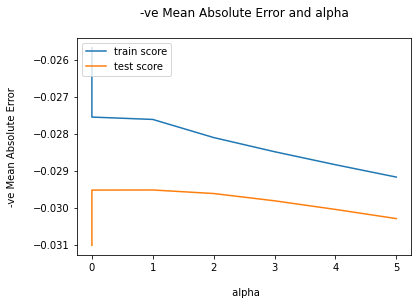

In [63]:
# plotting mean test and train scoes with alpha 
ridge_results['param_alpha'] = ridge_results['param_alpha'].astype('int32')

# plotting
plt.plot(ridge_results['param_alpha'], ridge_results['mean_train_score'])
plt.plot(ridge_results['param_alpha'], ridge_results['mean_test_score'])
plt.xlabel('\n alpha')
plt.ylabel('-ve Mean Absolute Error\n')
plt.title("-ve Mean Absolute Error and alpha\n")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [64]:
alpha = ridge_model.best_params_['alpha']
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)

#coefficient
ridge.coef_

array([-0.03875775,  0.04782355,  0.19282386,  0.07097091,  0.05450104,
        0.08182721,  0.08930013,  0.06280835,  0.15360132,  0.14729734,
        0.14824179, -0.06583582, -0.06344147, -0.08061603, -0.02247056,
       -0.01073379, -0.03687502, -0.01529716,  0.00811658, -0.049616  ,
       -0.14766836,  0.10232944,  0.08610616,  0.04247791,  0.0965835 ,
        0.07997957,  0.13809825,  0.041112  ,  0.07149289,  0.07695279])

In [65]:
# ridge model parameters
model_param  = list(ridge.coef_)
model_param .insert(0, ridge.intercept_)
model_param  = [round(x, 3) for x in model_param ]
cols = X_train.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_param ))

[('constant', -0.13),
 ('PoolArea', -0.039),
 ('OverallCond', 0.048),
 ('OverallQual', 0.193),
 ('YearBuilt', 0.071),
 ('2ndFlrSF', 0.055),
 ('GarageArea', 0.082),
 ('BsmtFinSF1', 0.089),
 ('TotalBsmtSF', 0.063),
 ('1stFlrSF', 0.154),
 ('GrLivArea', 0.147),
 ('LotArea', 0.148),
 ('KitchenQual_Fa', -0.066),
 ('KitchenQual_Gd', -0.063),
 ('KitchenQual_TA', -0.081),
 ('GarageQual_Fa', -0.022),
 ('GarageQual_Gd', -0.011),
 ('GarageQual_Po', -0.037),
 ('GarageQual_TA', -0.015),
 ('GarageType_BuiltIn', 0.008),
 ('Functional_Sev', -0.05),
 ('Condition2_PosN', -0.148),
 ('RoofMatl_CompShg', 0.102),
 ('RoofMatl_Membran', 0.086),
 ('RoofMatl_Roll', 0.042),
 ('RoofMatl_Tar&Grv', 0.097),
 ('RoofMatl_WdShake', 0.08),
 ('RoofMatl_WdShngl', 0.138),
 ('SaleType_Con', 0.041),
 ('Neighborhood_NoRidge', 0.071),
 ('Neighborhood_StoneBr', 0.077)]

In [66]:
# prediction with ridge 
ridgem = Ridge(alpha=ridge_model.best_params_['alpha'])
ridgem.fit(X_train, y_train)

# predicttion on train,test and val
y_train_pred = ridgem.predict(X_train)
print(f'r2 on train =  {round(metrics.r2_score(y_true=y_train, y_pred=y_train_pred),4)}')
y_test_pred = ridgem.predict(X_test)
print(f'r2 on test =  {round(metrics.r2_score(y_true=y_test, y_pred=y_test_pred),4)}')
y_val_pred = ridgem.predict(x_df_val[cols[1:]])
print(f'r2 on val =  {round(metrics.r2_score(y_true=y_df_val, y_pred=y_val_pred),4)}')

r2 on train =  0.8294
r2 on test =  0.8146
r2 on val =  0.8482


A list of predictive variables

In [67]:
mod = list(zip(cols, model_param))
params = pd.DataFrame(mod)
params.columns = ['Variable', 'Coeff']
params_sort = params.sort_values((['Coeff']), axis = 0, ascending = False)
params_sort

,Variable,Coeff
3,OverallQual,0.193
9,1stFlrSF,0.154
11,LotArea,0.148
10,GrLivArea,0.147
27,RoofMatl_WdShngl,0.138
22,RoofMatl_CompShg,0.102
25,RoofMatl_Tar&Grv,0.097
7,BsmtFinSF1,0.089
23,RoofMatl_Membran,0.086
6,GarageArea,0.082


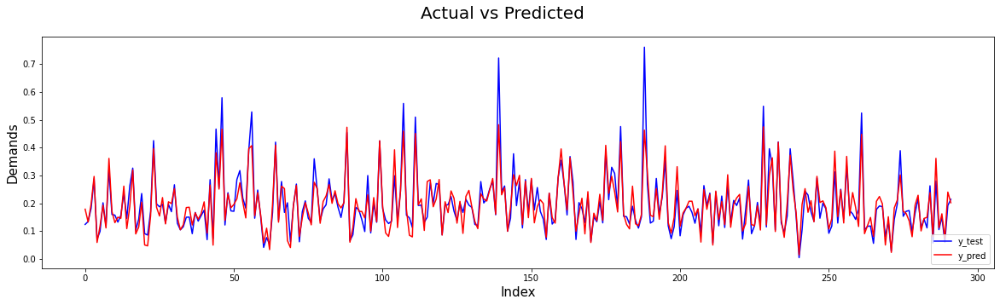

In [68]:
# Actual vs Predicted
plt.figure(figsize=[20,5])
c = [i for i in range(0,len(y_df_val),1)]
plt.plot(c,y_df_val, color="blue")
plt.plot(c,y_val_pred, color="red")
plt.suptitle('Actual vs Predicted\n', fontsize = 20)
plt.legend(["y_test", "y_pred"], loc ="lower right")
plt.xlabel('Index',fontsize=15)
plt.ylabel('Demands',fontsize=15)
plt.show()

In [69]:
print('RMSE error ', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred)))

RMSE error  0.05029938569699619


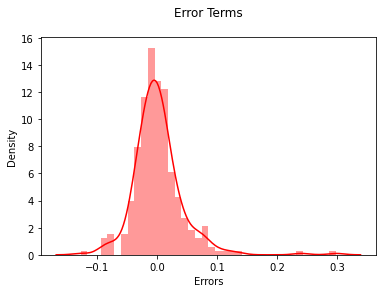

In [70]:
#Plot a histogram of the error terms
def plot_res_dist(act, pred):
    sns.distplot(act-pred,color='red')
    plt.title('Error Terms\n')
    plt.xlabel('Errors')
    
plot_res_dist(y_df_val,y_val_pred)

we can see that the mean lies at 0 so we have good model in hand

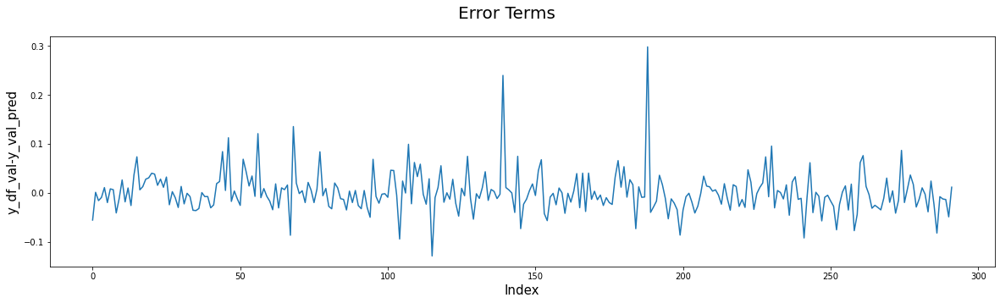

In [71]:
# Error Terms
plt.figure(figsize=[20,5])
c = [i for i in range(0,len(y_df_val),1)]
plt.plot(c,y_df_val-y_val_pred)
plt.suptitle('Error Terms', fontsize = 20)
plt.xlabel('Index', fontsize = 15)
plt.ylabel('y_df_val-y_val_pred', fontsize = 15)
plt.show()

In [72]:
#y_test vs y_pred
import scipy.stats
stat, p = scipy.stats.pearsonr(y_df_val, y_val_pred) 
fig = px.scatter(x=y_df_val,y=y_val_pred, trendline="ols", trendline_color_override="red",
                title=f'Relationship Between y_test and y_pred [corr = {round(stat,4)}]',
                template='none')
fig.update_xaxes(showgrid=False,title='y_test')
fig.update_yaxes(showgrid=False,title='y_pred')
fig.show()

### Conclusion

Although both the models have kind of the same r2 scores, the r2 score for the ridge is kind of better as compared to lasso.

`The outcomes are as follows:`

**for lasso:**

best alpha = {'alpha': 0.0001}

r2 on train =  0.8279

r2 on test =  0.8155

r2 on val =  0.8476

**for ridge:**

best alpha  = {'alpha': 1.0}

r2 on train =  0.8294

r2 on test =  0.8146

r2 on val =  0.8482